In [2]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [3]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [4]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)

In [5]:
vocab = model.keys()
def build_avg_vec(sentence, num_features, doc_id):
    featureVec = np.zeros((num_features,), dtype="float32")
    nwords = 0
    for word in sentence.split():
        nwords += 1
        if word in vocab and word in  idf_title_vectorizer.vocabulary_:
            featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    
    return featureVec
                

In [6]:
def n_containing(word):
    return sum(1 for blob in data['title'] if word in blob.split())
def idf(word):
    return math.log(data.shape[0] / (n_containing(word)))
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])
idf_title_features  = idf_title_features.astype(np.float)
for i in idf_title_vectorizer.vocabulary_.keys():
    idf_val = idf(i)
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val


In [7]:
doc_id = 0
w2v_title_weight = []
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id))
    doc_id = doc_id + 1
w2v_title_weight = np.array(w2v_title_weight)

In [18]:
# Utility functions

def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
    
def get_word_vec(sentence, doc_id):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    
    
    vec = []
    for i in sentence.split():
        if i in vocab and i in  idf_title_vectorizer.vocabulary_:
            vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word  in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)

def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
   
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [12]:
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)


color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

brand_feature = brand_features.tocsr()
color_feature = color_features.tocsr()

In [15]:
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)
df_asins = list(data['asin'])

def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    d_id = asins.index(df_asins[doc_id])
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    
    brand_feat_dist = pairwise_distances(brand_feature, brand_feature[doc_id])
    
    color_feat_dist = pairwise_distances(color_feature,color_feature[doc_id])
    
    cnn_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_feat_dist + w3 * color_feat_dist + w4 * cnn_dist )/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i])
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)


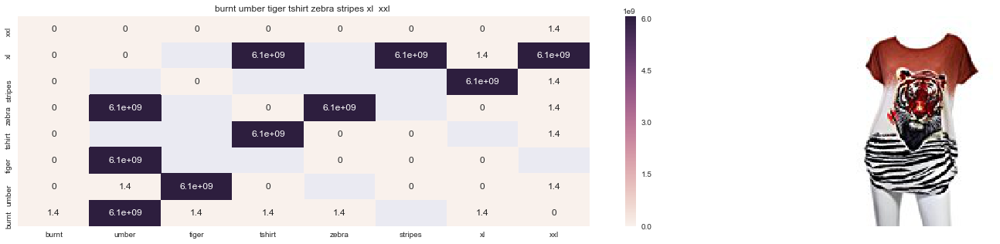

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0120251059532


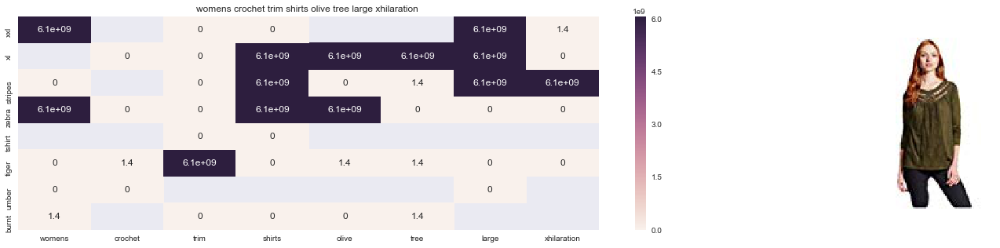

ASIN : B06XBHNM7J
Brand : Xhilaration
euclidean distance from input : 12.1458658731


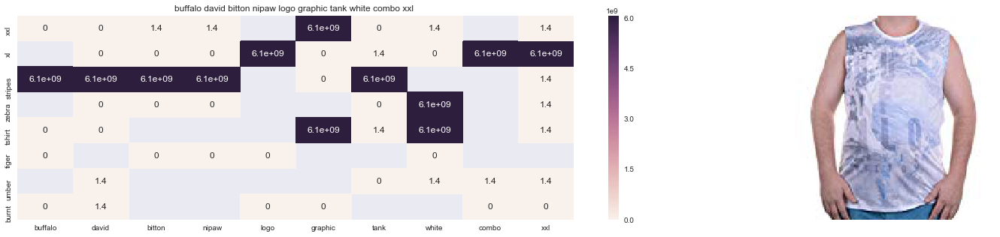

ASIN : B018H5AZXQ
Brand : Buffalo
euclidean distance from input : 12.6118242777


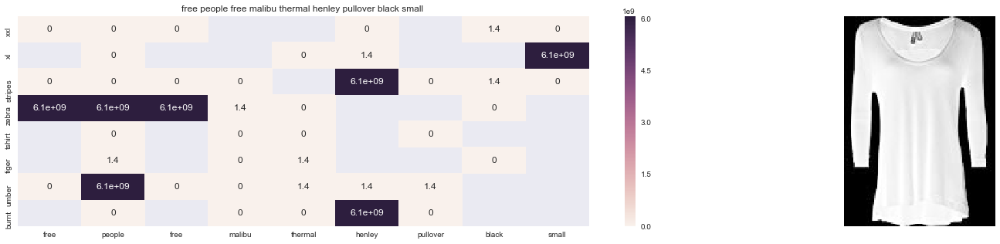

ASIN : B074MXY984
Brand : We The Free
euclidean distance from input : 12.8612548866


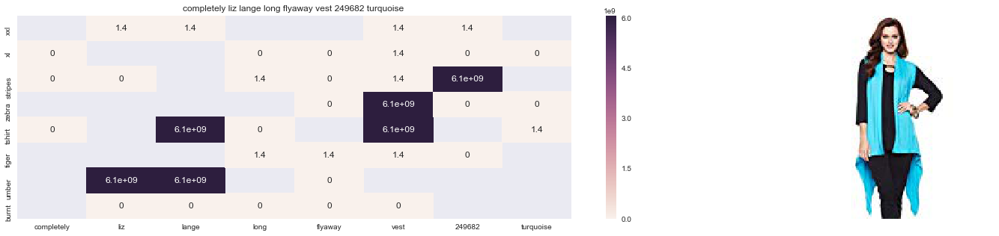

ASIN : B074LTBWSW
Brand : Liz Lange
euclidean distance from input : 12.8642198564


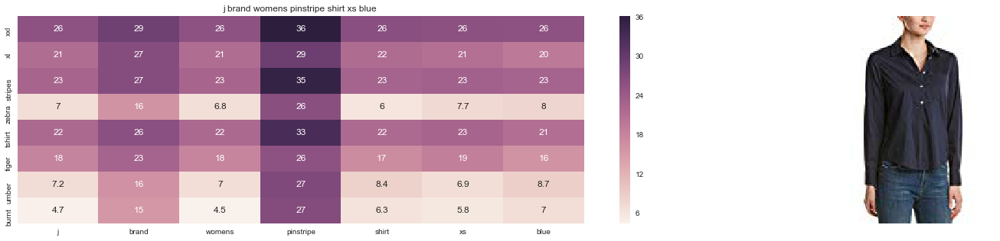

ASIN : B06XYP1X1F
Brand : J Brand Jeans
euclidean distance from input : 12.9260528564


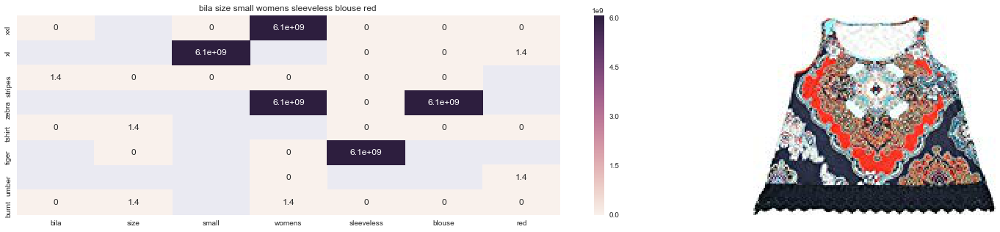

ASIN : B01L7ROZNC
Brand : Bila
euclidean distance from input : 12.9462357778


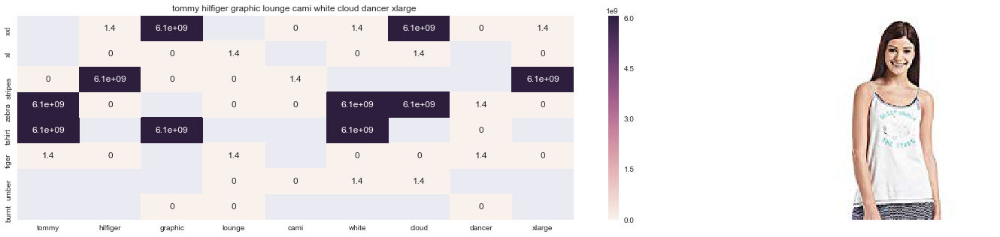

ASIN : B01BMSFYW2
Brand : igertommy hilf
euclidean distance from input : 13.1702651978


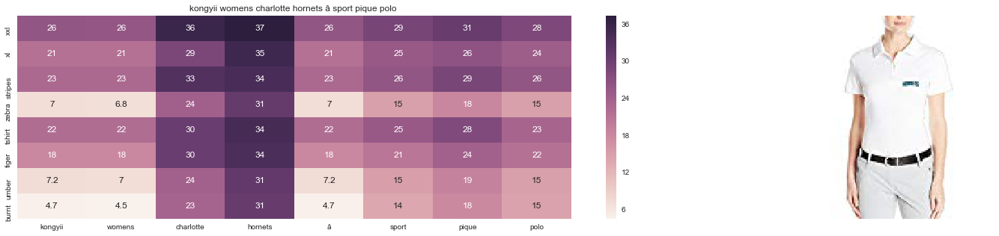

ASIN : B01FJVZST2
Brand : KONGYII
euclidean distance from input : 13.2889066


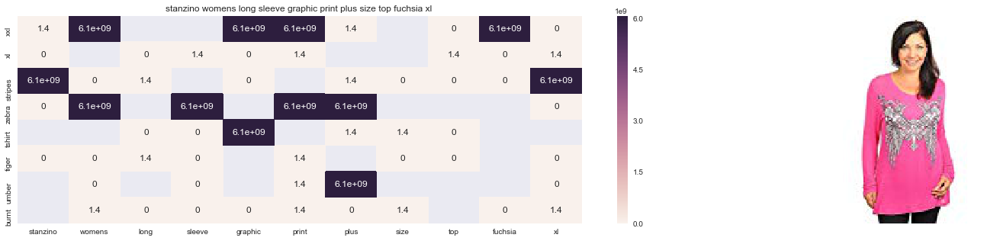

ASIN : B00DP4VHWI
Brand : Stanzino
euclidean distance from input : 13.3142480154


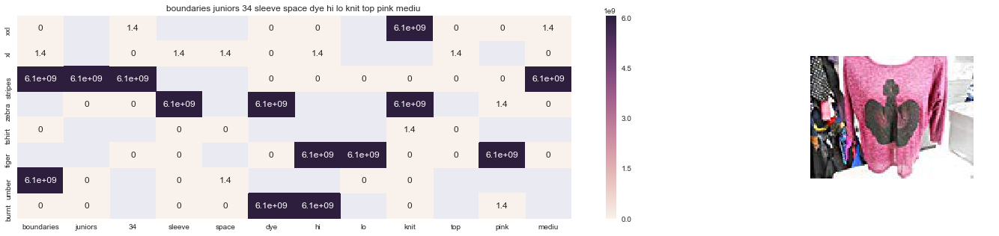

ASIN : B01EXXFS4M
Brand : No Boundaries
euclidean distance from input : 13.3198451997


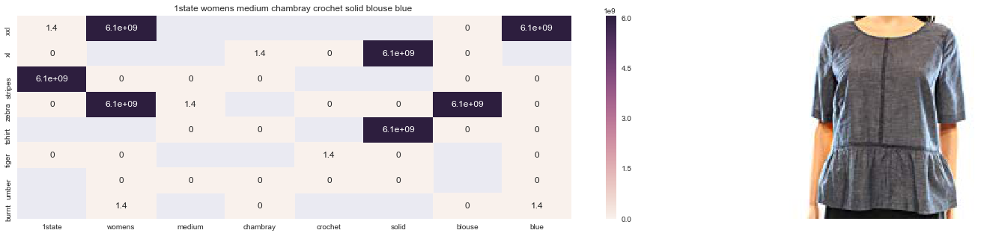

ASIN : B074MK6LV2
Brand : 1.State
euclidean distance from input : 13.3222022314


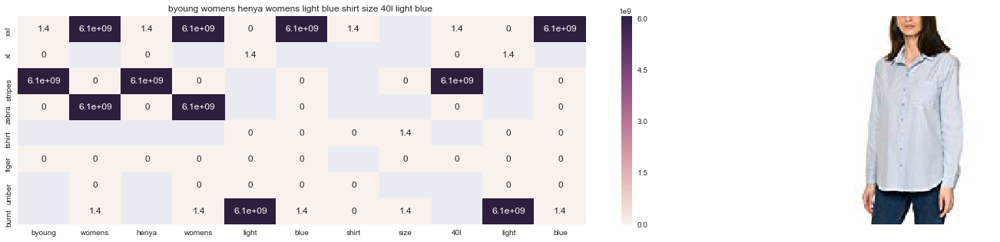

ASIN : B06Y41MRCH
Brand : Byoung
euclidean distance from input : 13.3775030649


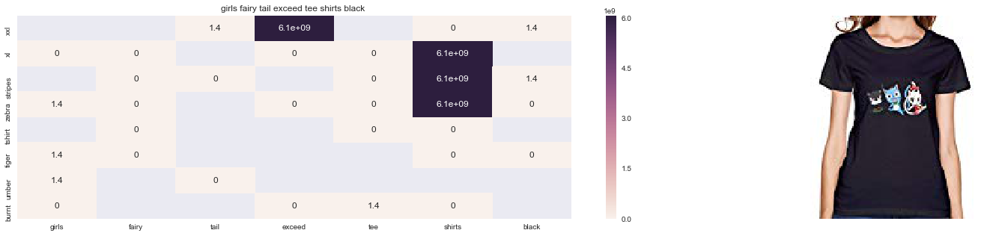

ASIN : B01L9F153U
Brand : ATYPEMX
euclidean distance from input : 13.3953452368


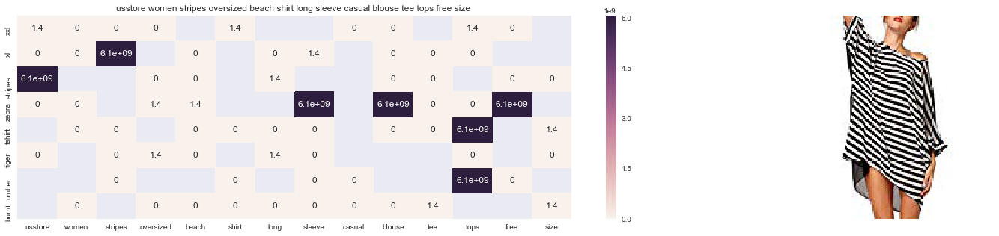

ASIN : B01DNNI1RO
Brand : Usstore
euclidean distance from input : 13.4006342447


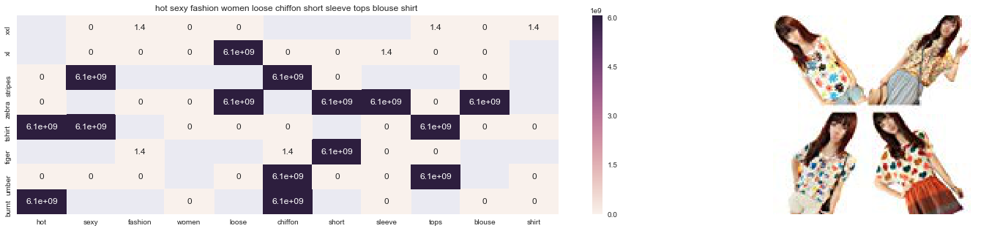

ASIN : B00JMAASRO
Brand : Wotefusi
euclidean distance from input : 13.4044570227


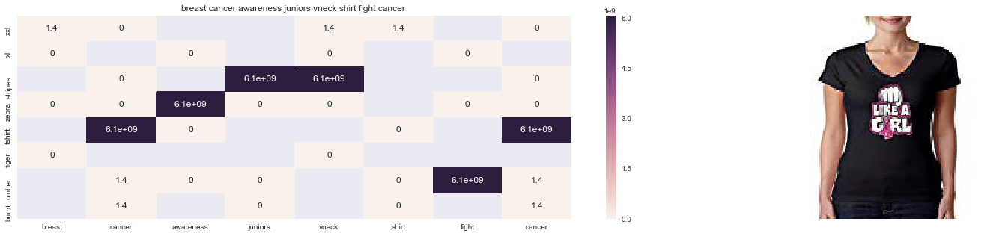

ASIN : B016CU40IY
Brand : Juiceclouds
euclidean distance from input : 13.4073146124


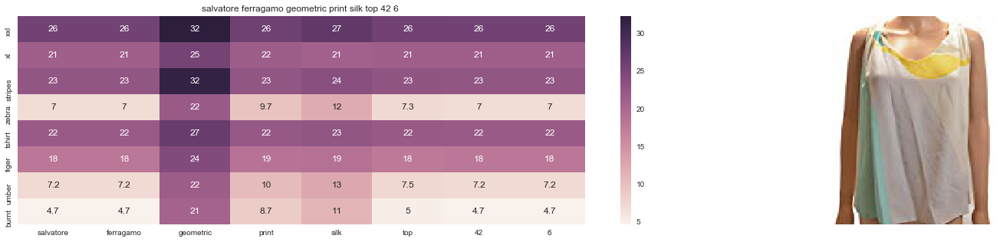

ASIN : B0756JTS1F
Brand : Salvatore Ferragamo
euclidean distance from input : 13.4441260594


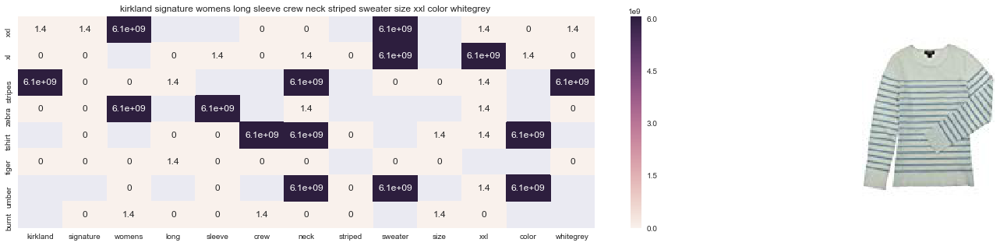

ASIN : B06XTPC3FP
Brand : Kirkland Signature
euclidean distance from input : 13.4619256974


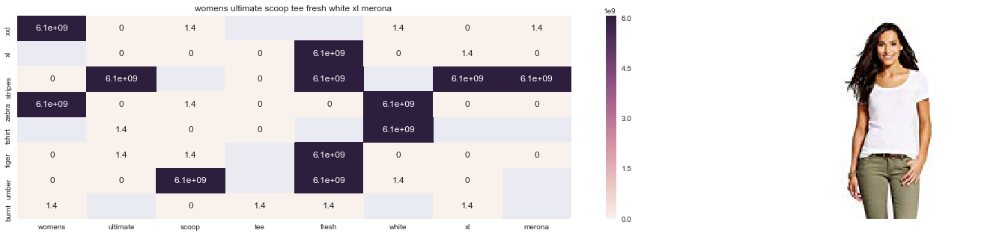

ASIN : B01G7XE50E
Brand : Merona
euclidean distance from input : 13.4908551474


In [24]:
# equal weightage to all the features
idf_w2v_brand(12566, 5, 5, 5, 5,20)

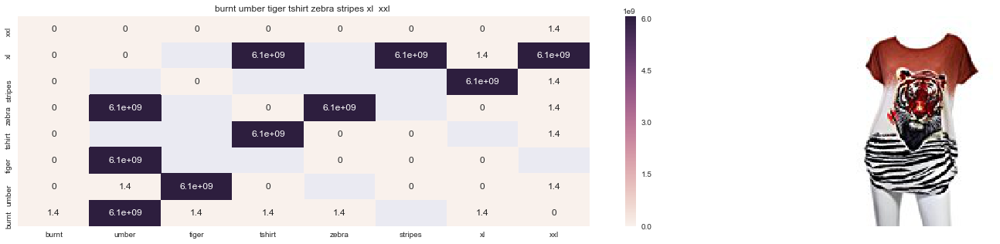

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.00796567788348


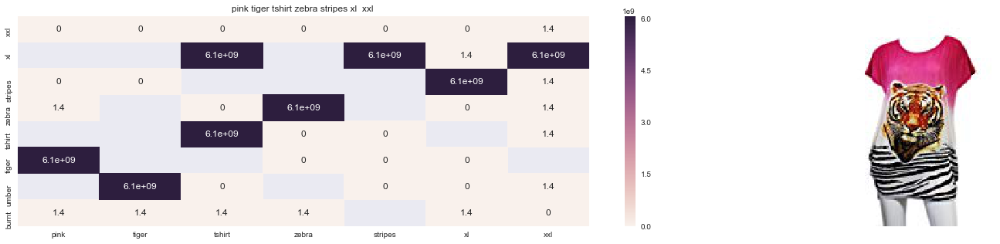

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 8.78044490819


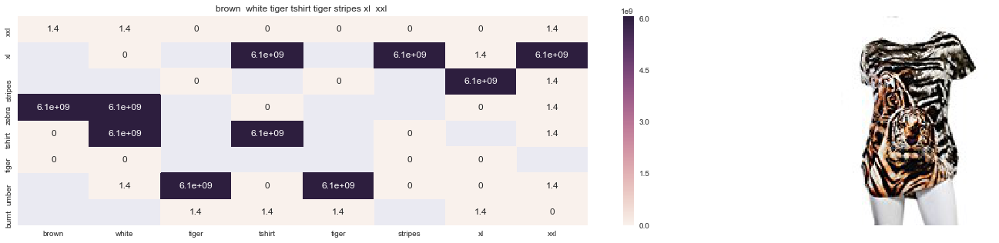

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 9.92532300949


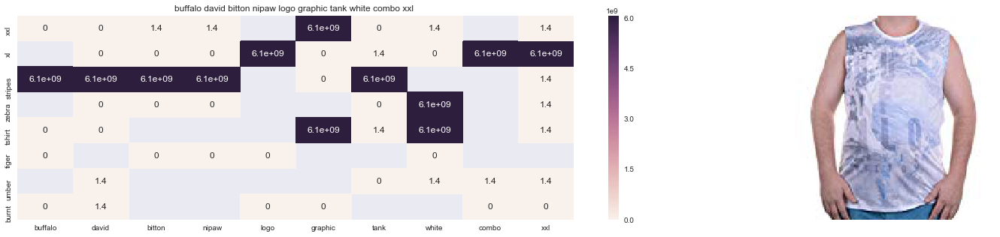

ASIN : B018H5AZXQ
Brand : Buffalo
euclidean distance from input : 10.0165130872


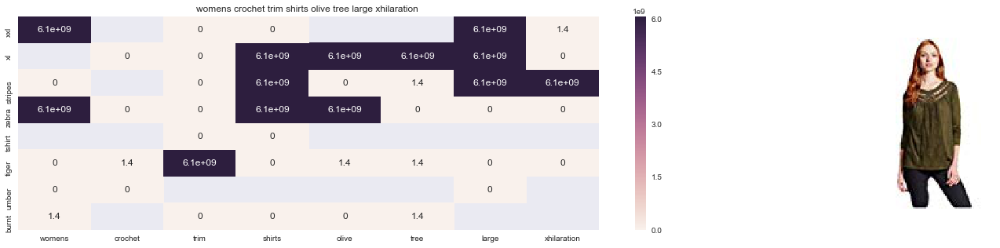

ASIN : B06XBHNM7J
Brand : Xhilaration
euclidean distance from input : 10.0387050885


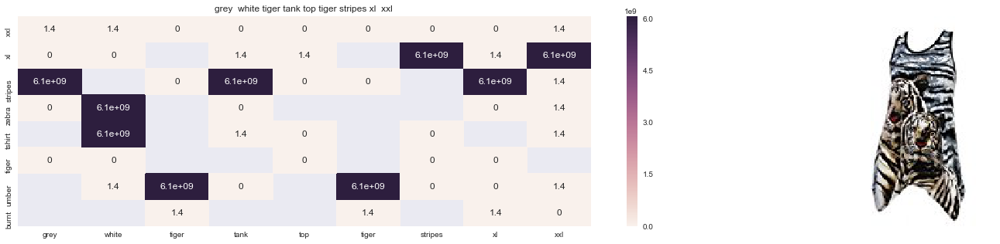

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 10.2676985741


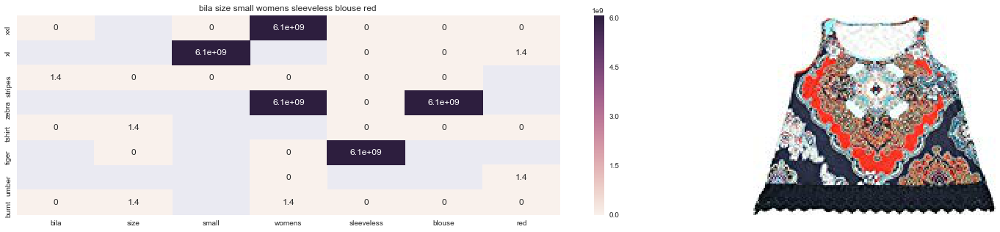

ASIN : B01L7ROZNC
Brand : Bila
euclidean distance from input : 10.2742015491


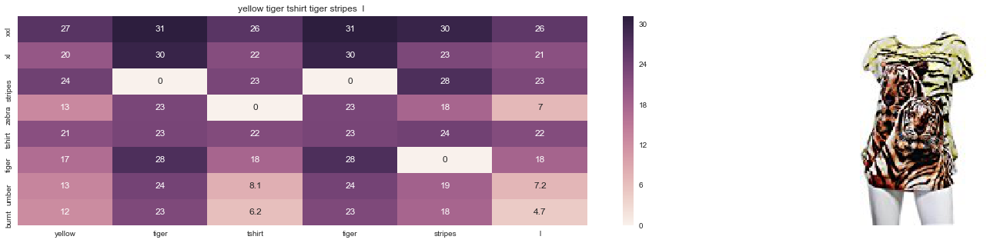

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 10.3823035241


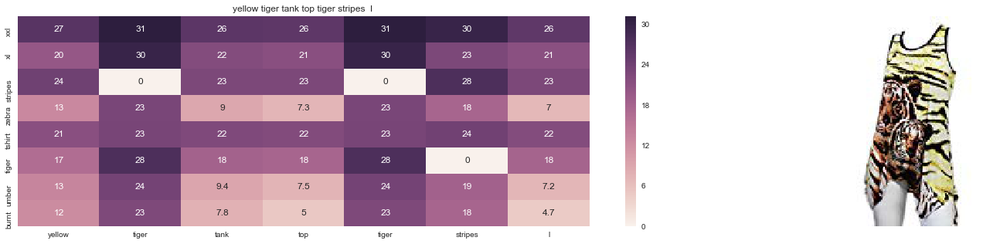

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 10.4175894738


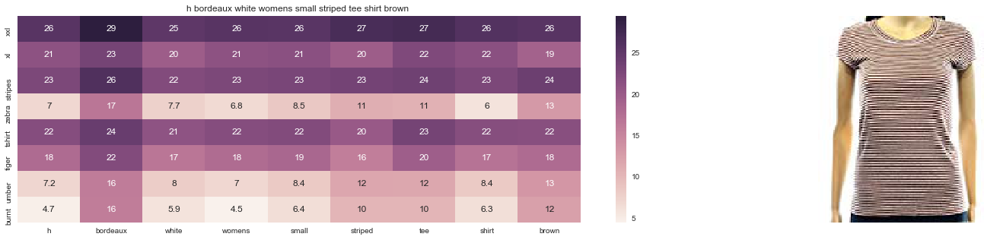

ASIN : B072BVB47Z
Brand : H By Bordeaux
euclidean distance from input : 10.4198374748


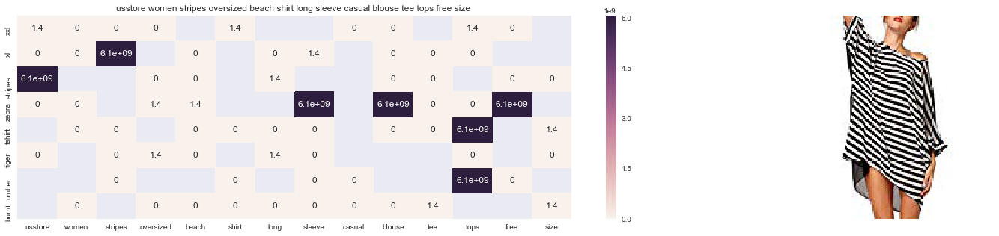

ASIN : B01DNNI1RO
Brand : Usstore
euclidean distance from input : 10.4756519574


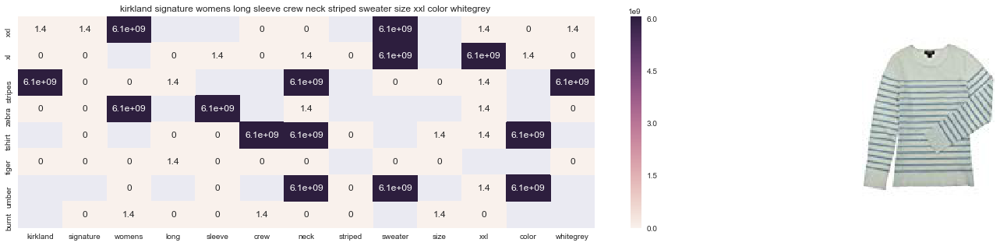

ASIN : B06XTPC3FP
Brand : Kirkland Signature
euclidean distance from input : 10.4936607361


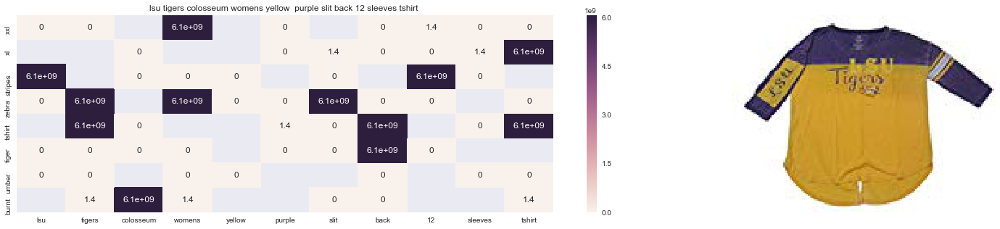

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 10.4940766463


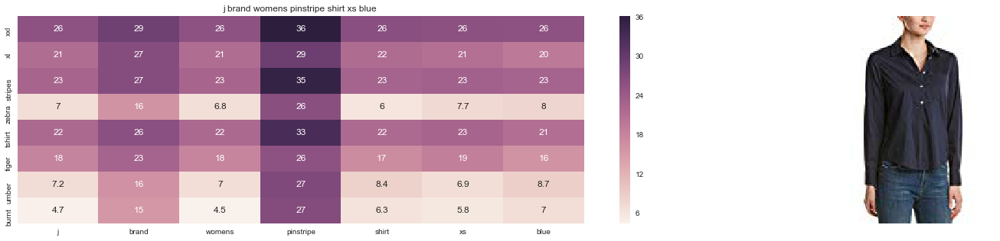

ASIN : B06XYP1X1F
Brand : J Brand Jeans
euclidean distance from input : 10.5198669434


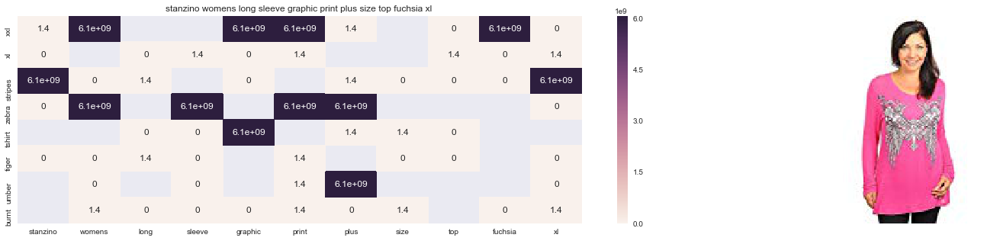

ASIN : B00DP4VHWI
Brand : Stanzino
euclidean distance from input : 10.5242582927


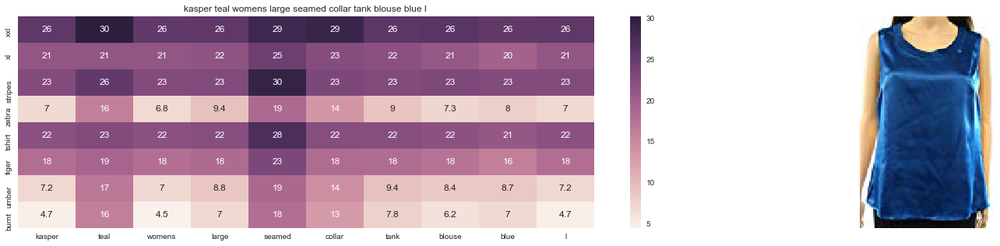

ASIN : B0722DJVQP
Brand : Kasper
euclidean distance from input : 10.535247005


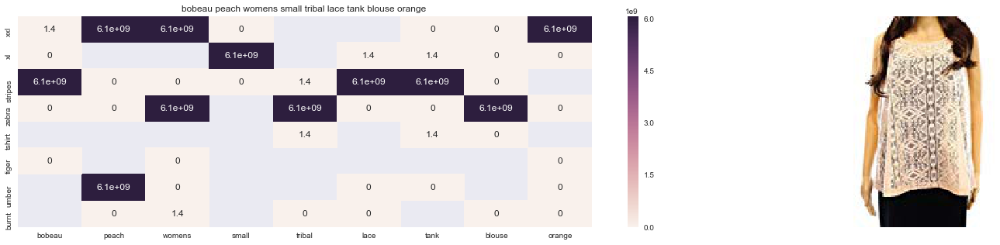

ASIN : B072JTHCX6
Brand : Bobeau
euclidean distance from input : 10.5763723025


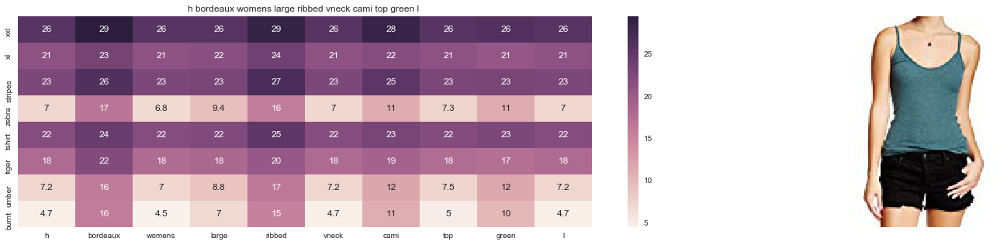

ASIN : B06XWWH6KJ
Brand : H By Bordeaux
euclidean distance from input : 10.5829470635


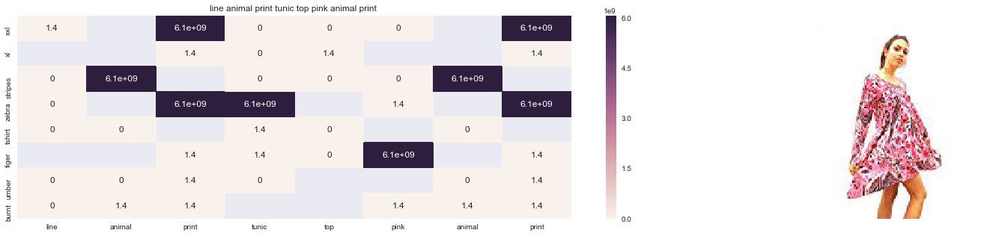

ASIN : B01LMJ5XYK
Brand : Romeo 4 Ever
euclidean distance from input : 10.5900454521


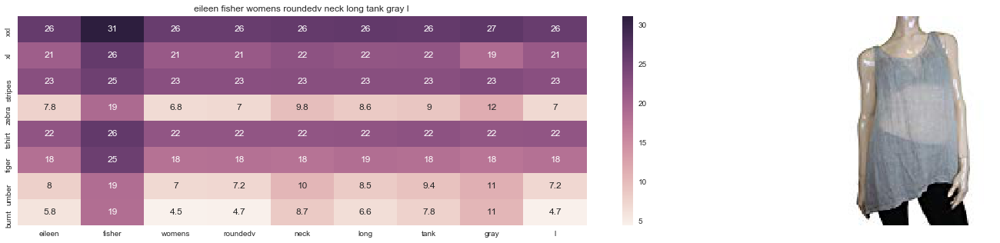

ASIN : B01N2JSRDM
Brand : Eileen Fisher
euclidean distance from input : 10.614139843


In [20]:
# More weightage assigned to w2f distance
idf_w2v_brand(12566, 5, 1, 1, 1 , 20)

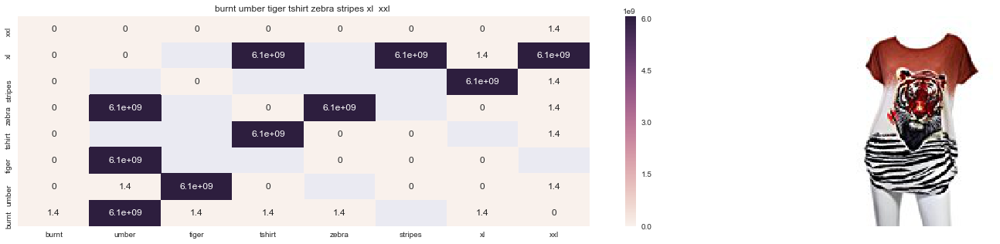

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.00601255288348


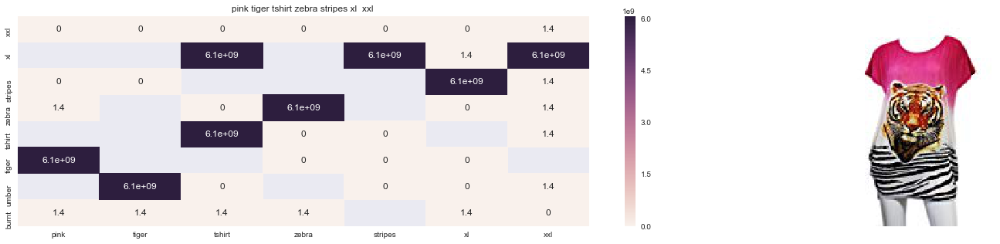

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 6.74850099091


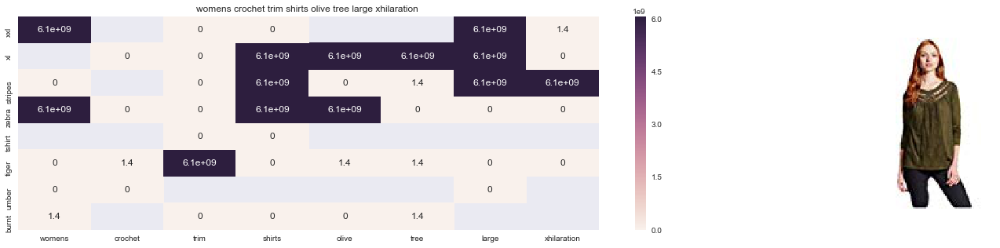

ASIN : B06XBHNM7J
Brand : Xhilaration
euclidean distance from input : 6.93895822115


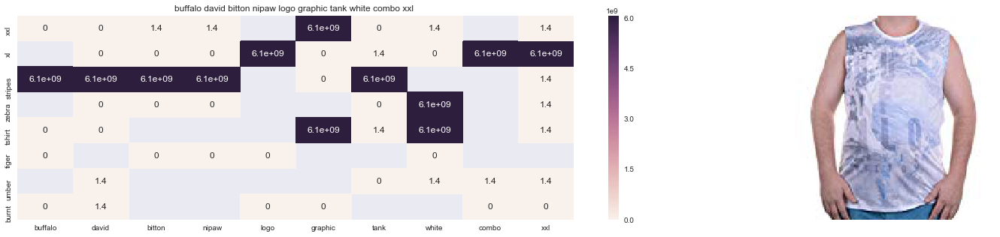

ASIN : B018H5AZXQ
Brand : Buffalo
euclidean distance from input : 7.17193739958


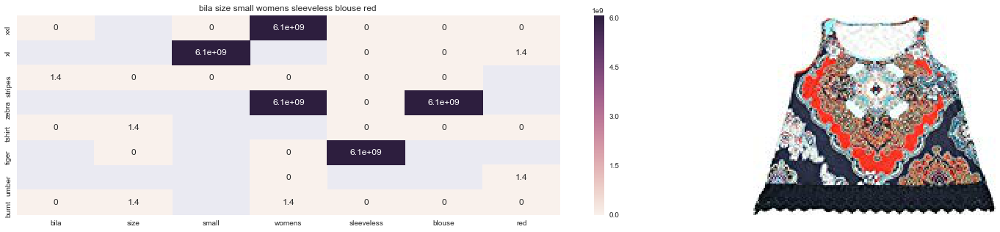

ASIN : B01L7ROZNC
Brand : Bila
euclidean distance from input : 7.33914320926


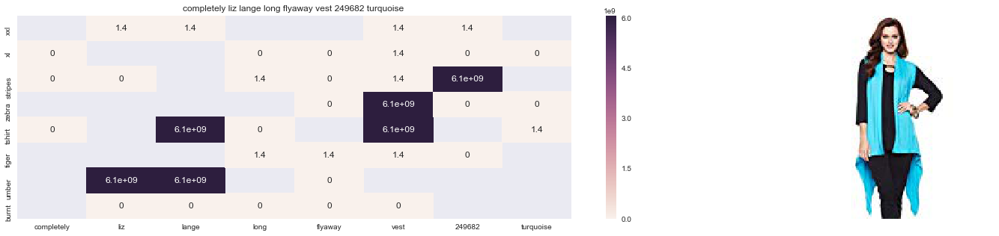

ASIN : B074LTBWSW
Brand : Liz Lange
euclidean distance from input : 7.4321099997


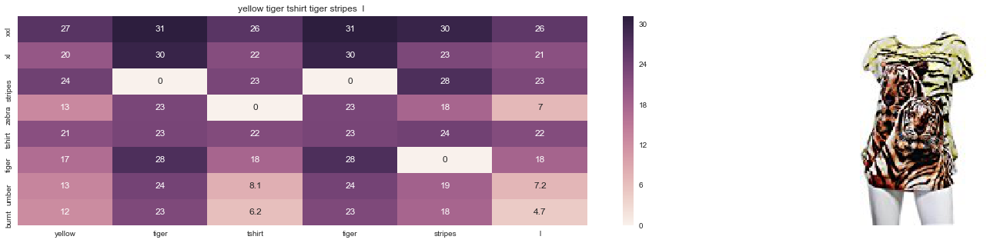

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 7.43558226828


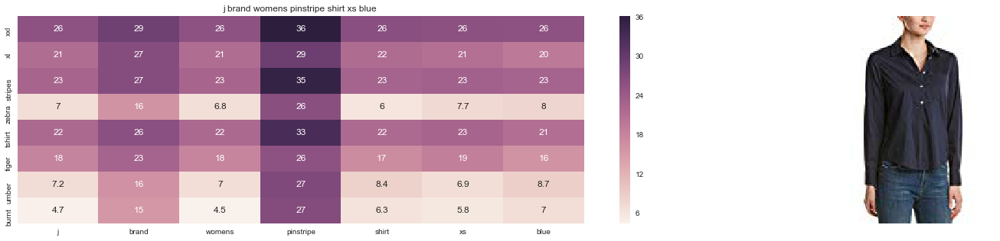

ASIN : B06XYP1X1F
Brand : J Brand Jeans
euclidean distance from input : 7.46302640438


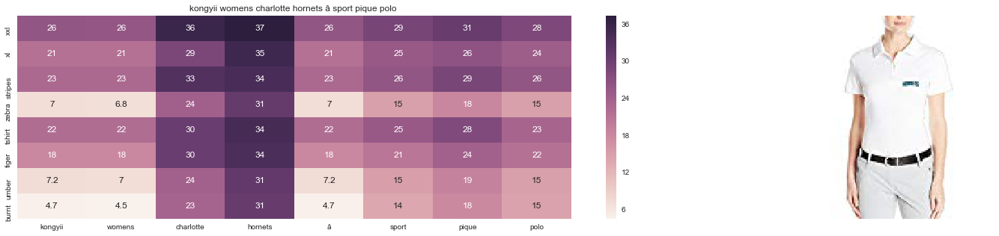

ASIN : B01FJVZST2
Brand : KONGYII
euclidean distance from input : 7.51047860841


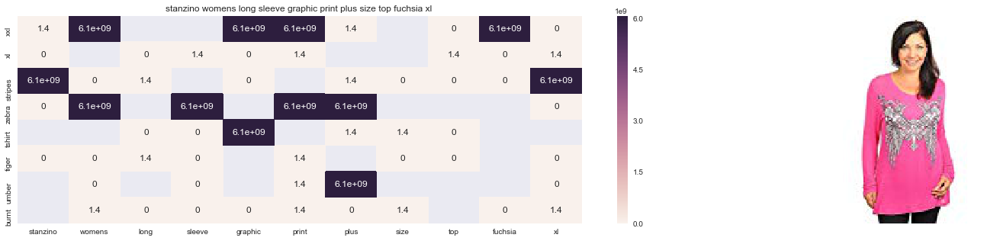

ASIN : B00DP4VHWI
Brand : Stanzino
euclidean distance from input : 7.52314918499


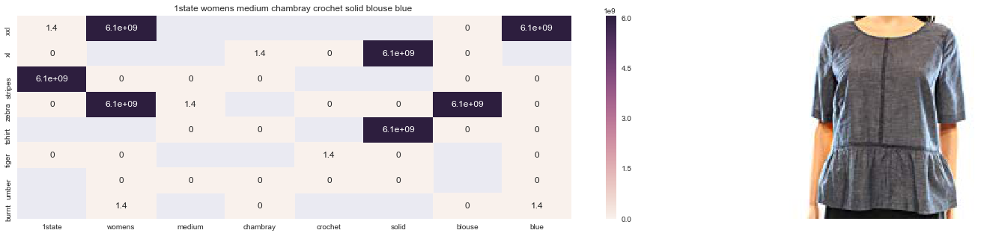

ASIN : B074MK6LV2
Brand : 1.State
euclidean distance from input : 7.52712654333


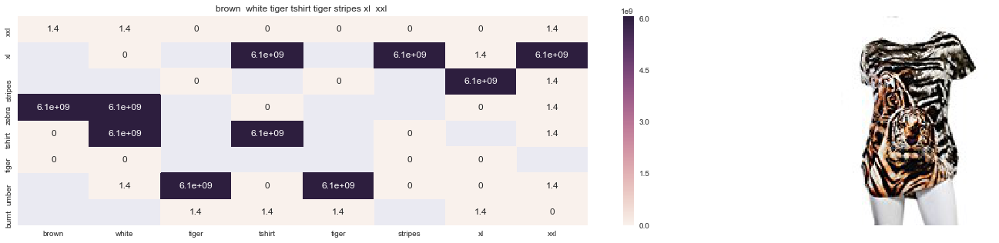

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 7.53985202312


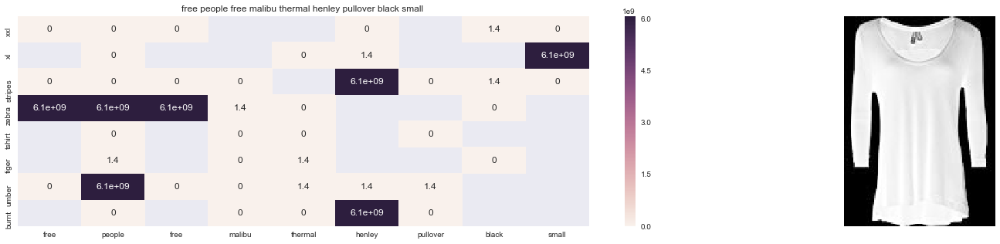

ASIN : B074MXY984
Brand : We The Free
euclidean distance from input : 7.54866152743


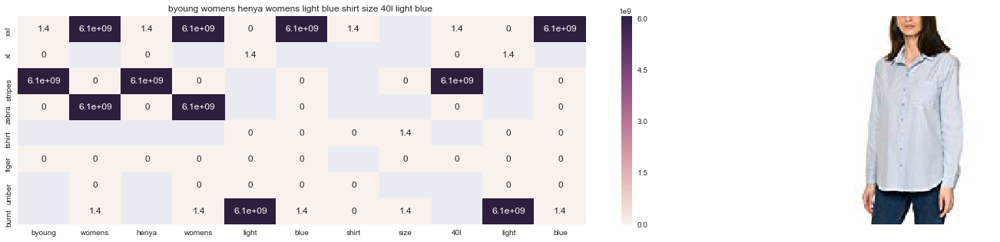

ASIN : B06Y41MRCH
Brand : Byoung
euclidean distance from input : 7.55477696008


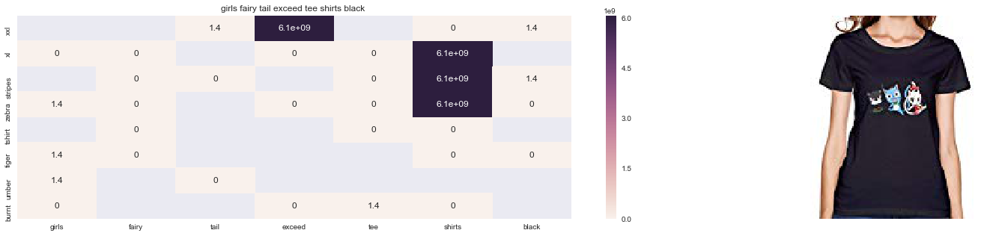

ASIN : B01L9F153U
Brand : ATYPEMX
euclidean distance from input : 7.56369804601


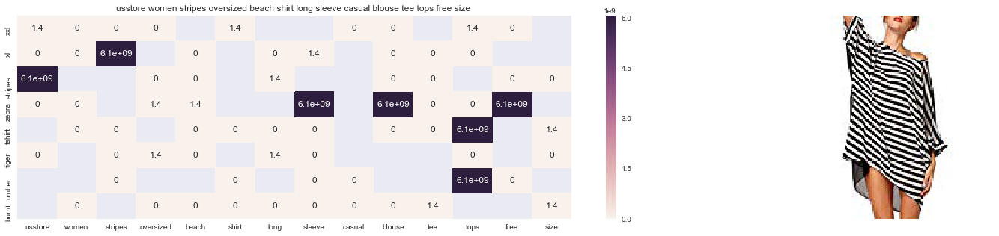

ASIN : B01DNNI1RO
Brand : Usstore
euclidean distance from input : 7.56634246654


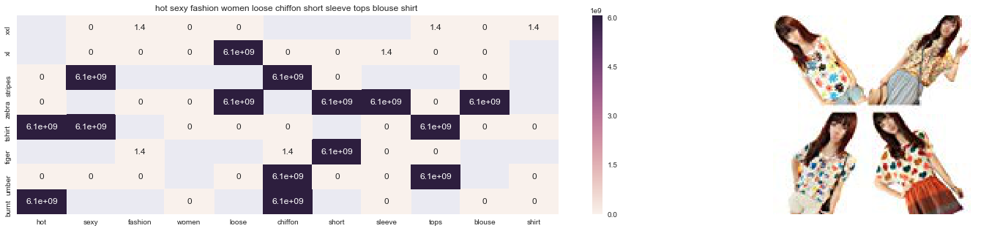

ASIN : B00JMAASRO
Brand : Wotefusi
euclidean distance from input : 7.56825398664


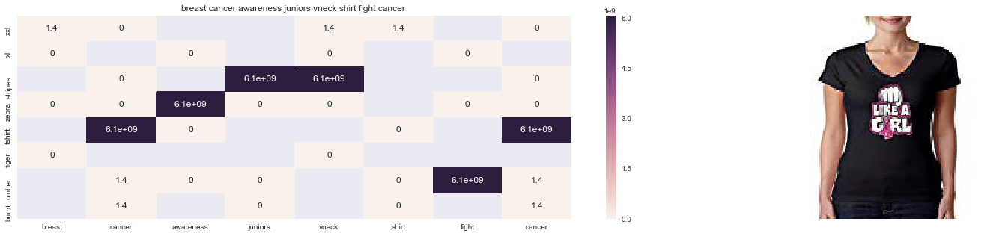

ASIN : B016CU40IY
Brand : Juiceclouds
euclidean distance from input : 7.56968282919


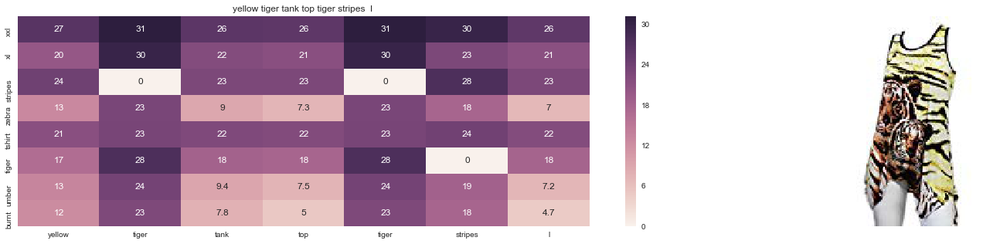

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 7.57282780413


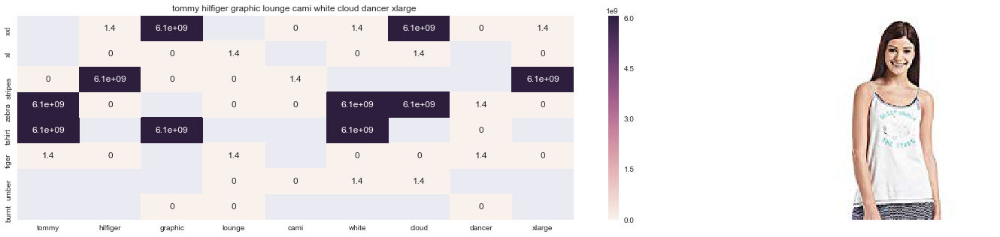

ASIN : B01BMSFYW2
Brand : igertommy hilf
euclidean distance from input : 7.58513271809


In [21]:
# More weightage assigned to  Brand distance
idf_w2v_brand(12566, 1, 5, 1, 1 , 20)

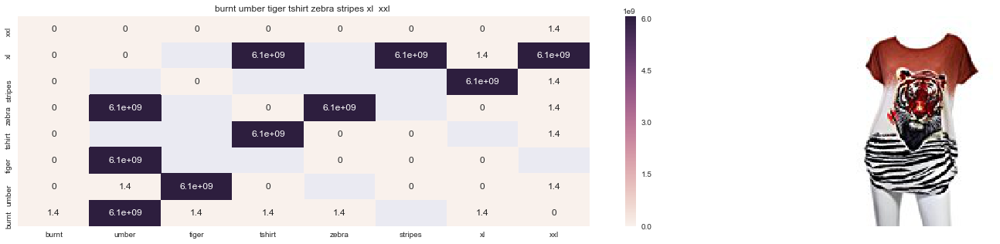

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.00601255288348


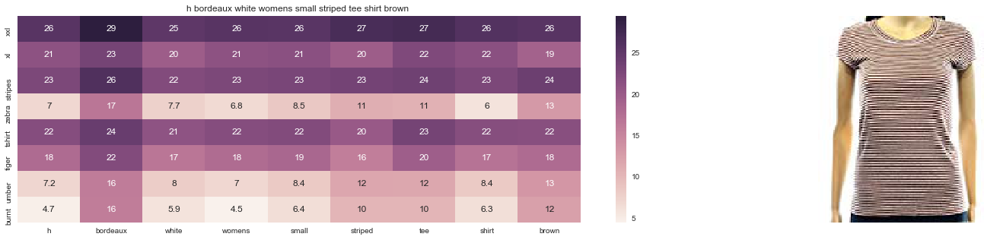

ASIN : B072BVB47Z
Brand : H By Bordeaux
euclidean distance from input : 6.85331219435


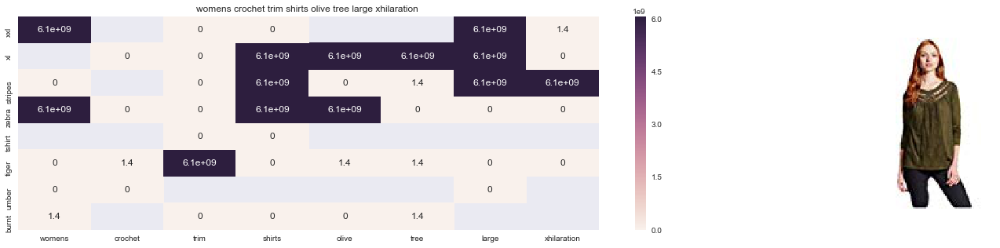

ASIN : B06XBHNM7J
Brand : Xhilaration
euclidean distance from input : 6.93895822115


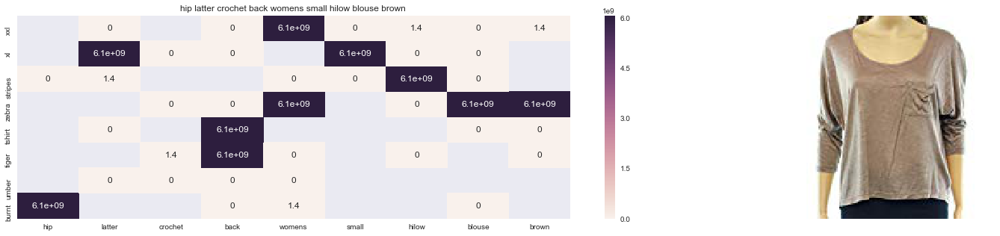

ASIN : B074MJN1K9
Brand : Hip
euclidean distance from input : 6.94718991609


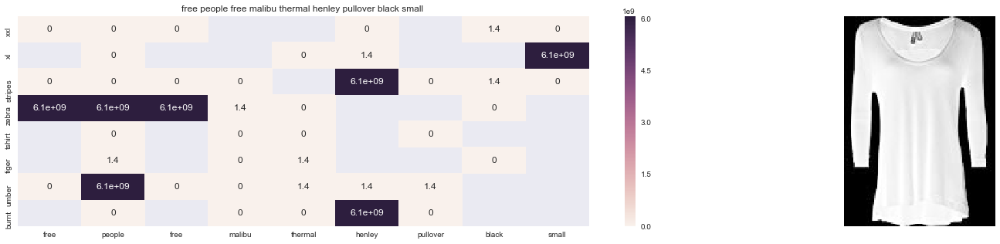

ASIN : B074MXY984
Brand : We The Free
euclidean distance from input : 7.13773431986


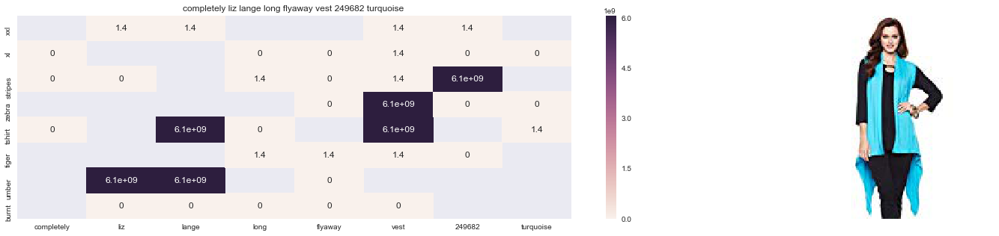

ASIN : B074LTBWSW
Brand : Liz Lange
euclidean distance from input : 7.13921678089


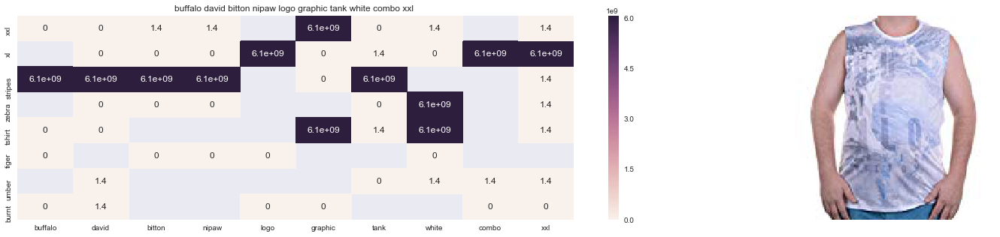

ASIN : B018H5AZXQ
Brand : Buffalo
euclidean distance from input : 7.17193739958


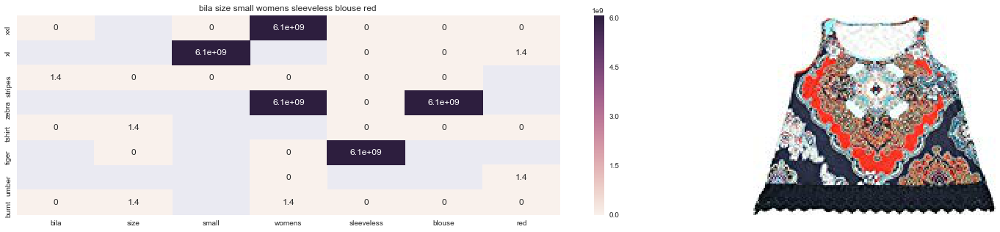

ASIN : B01L7ROZNC
Brand : Bila
euclidean distance from input : 7.18022458666


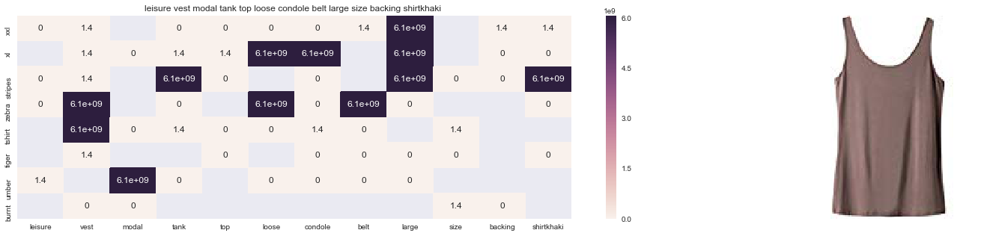

ASIN : B014OUHUZY
Brand : Black Temptation
euclidean distance from input : 7.29360949993


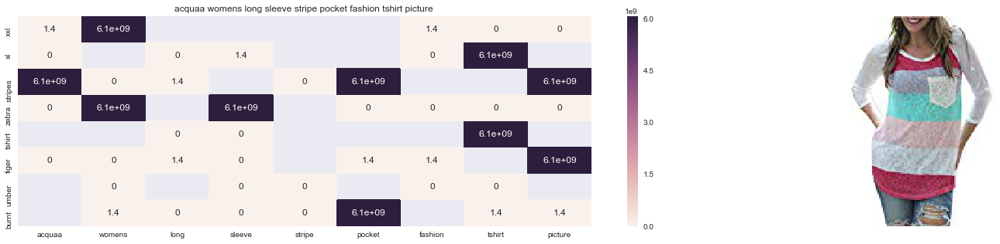

ASIN : B06XK2ZRFH
Brand : Acquaa
euclidean distance from input : 7.31117700429


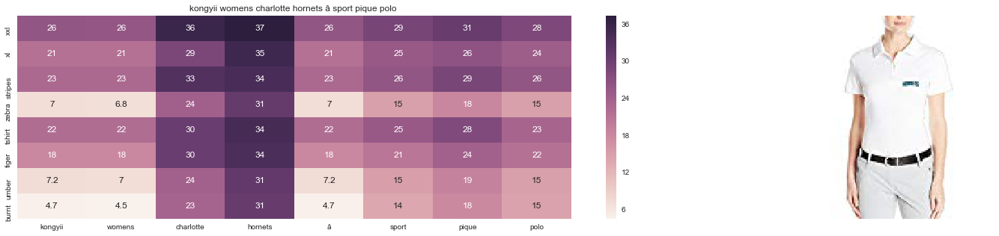

ASIN : B01FJVZST2
Brand : KONGYII
euclidean distance from input : 7.35155998582


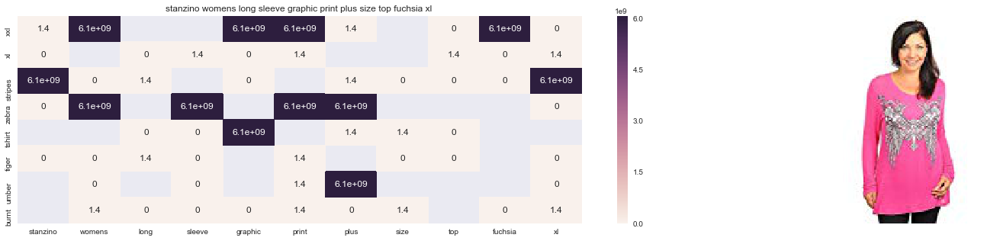

ASIN : B00DP4VHWI
Brand : Stanzino
euclidean distance from input : 7.36423056239


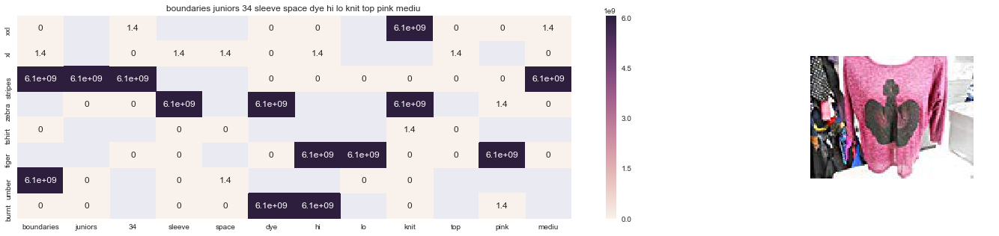

ASIN : B01EXXFS4M
Brand : No Boundaries
euclidean distance from input : 7.3670293095


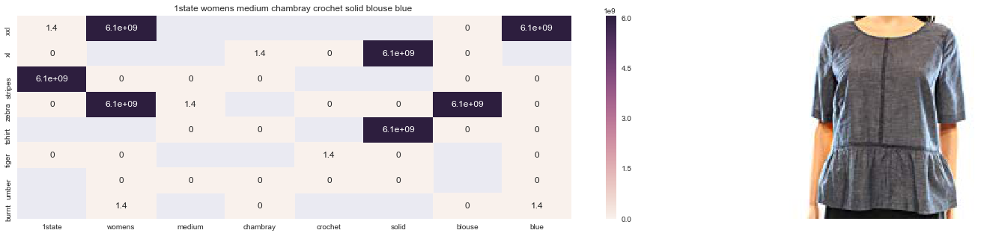

ASIN : B074MK6LV2
Brand : 1.State
euclidean distance from input : 7.36820792073


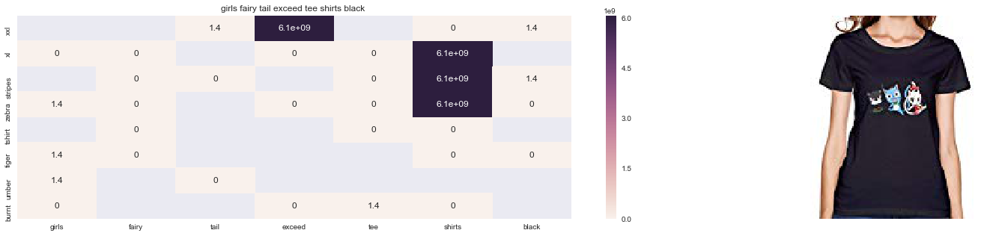

ASIN : B01L9F153U
Brand : ATYPEMX
euclidean distance from input : 7.40477942341


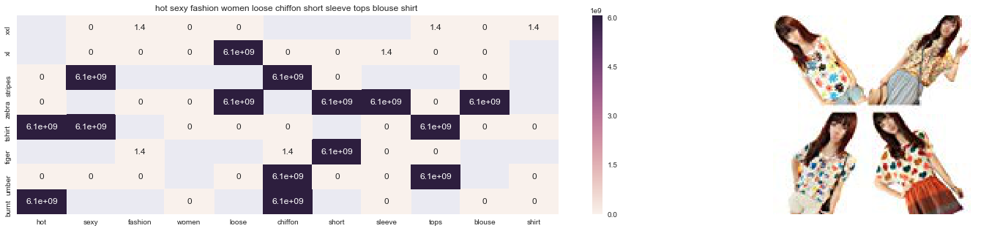

ASIN : B00JMAASRO
Brand : Wotefusi
euclidean distance from input : 7.40933536404


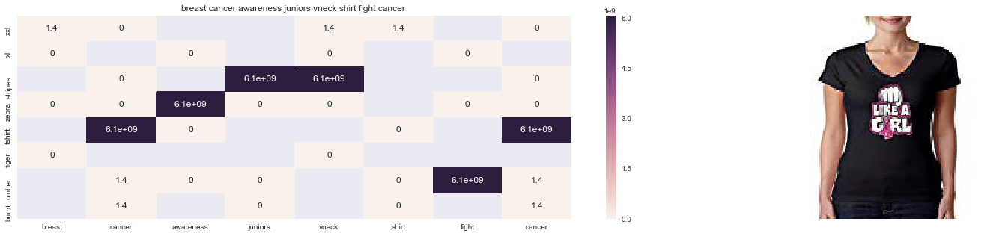

ASIN : B016CU40IY
Brand : Juiceclouds
euclidean distance from input : 7.41076420659


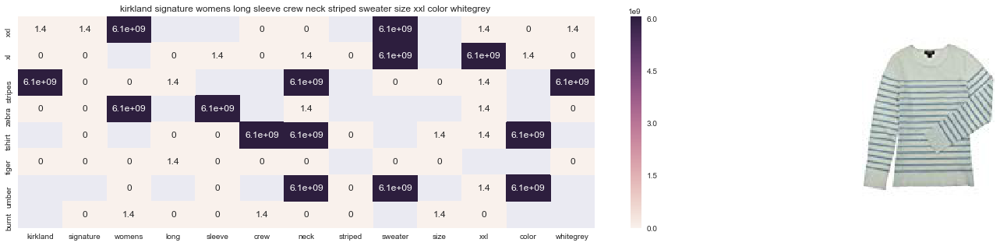

ASIN : B06XTPC3FP
Brand : Kirkland Signature
euclidean distance from input : 7.43806952261


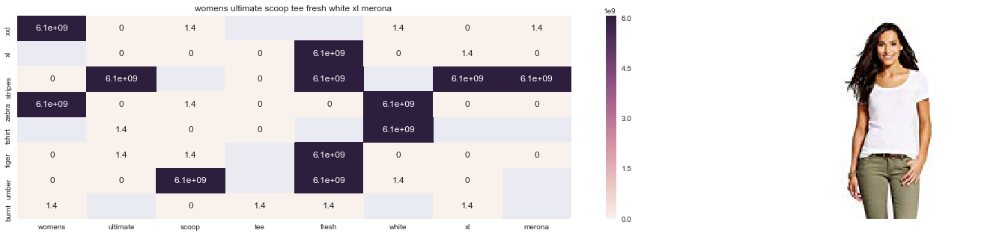

ASIN : B01G7XE50E
Brand : Merona
euclidean distance from input : 7.45253442639


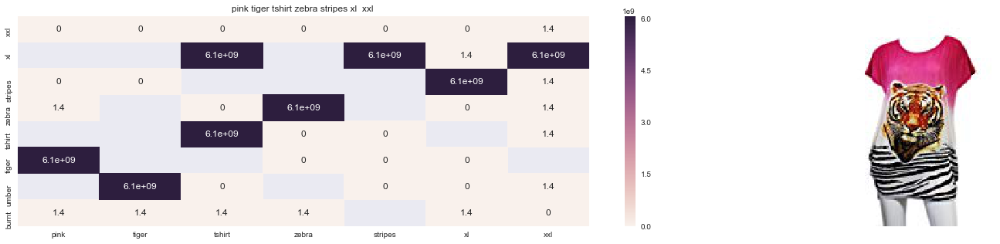

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 7.4556077721


In [22]:
# More weightage assigned to  Color distance
idf_w2v_brand(12566, 1, 1, 5, 1 , 20)

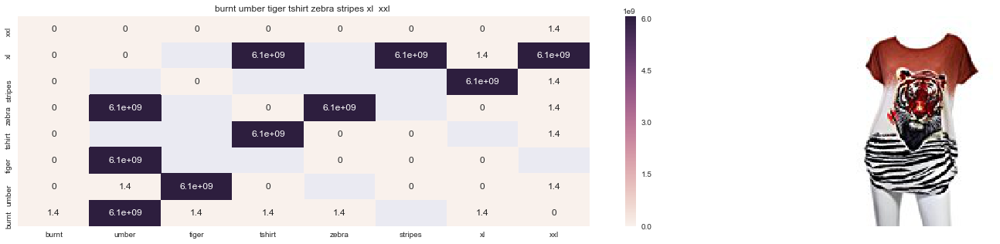

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.028109639883


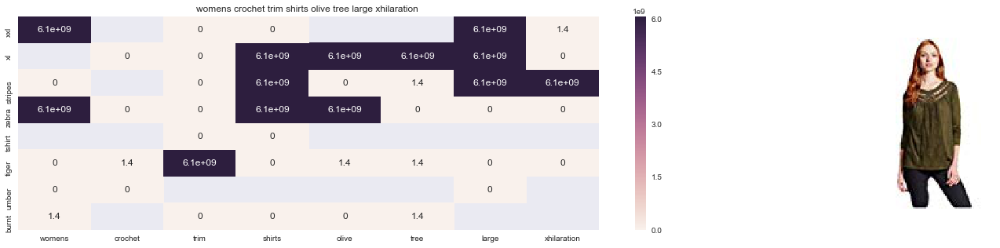

ASIN : B06XBHNM7J
Brand : Xhilaration
euclidean distance from input : 24.6668416041


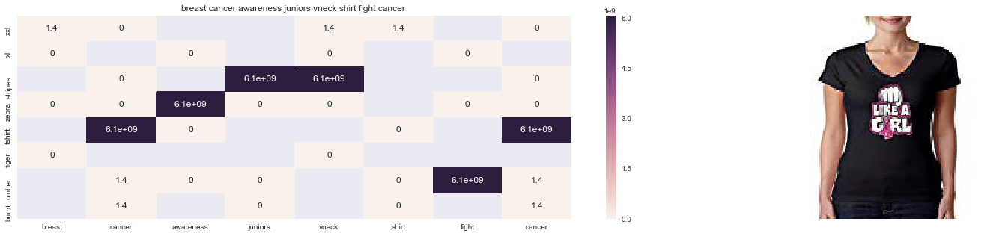

ASIN : B016CU40IY
Brand : Juiceclouds
euclidean distance from input : 25.8602445493


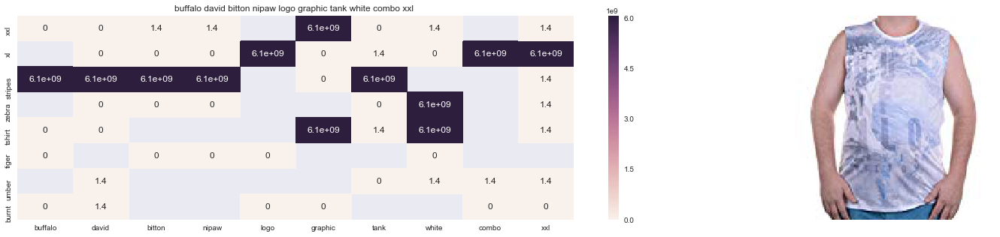

ASIN : B018H5AZXQ
Brand : Buffalo
euclidean distance from input : 26.0869087953


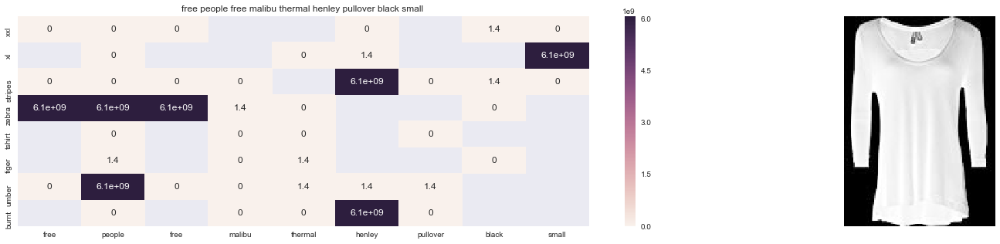

ASIN : B074MXY984
Brand : We The Free
euclidean distance from input : 26.1127197285


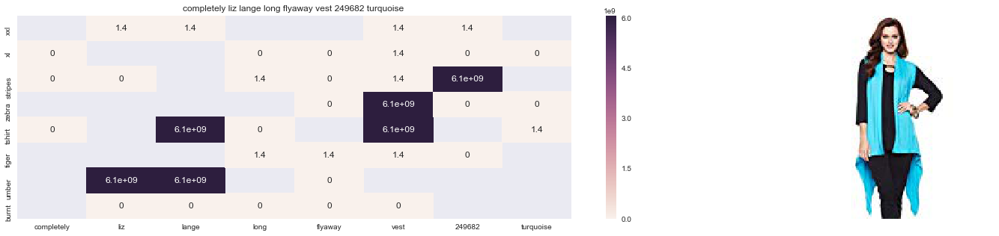

ASIN : B074LTBWSW
Brand : Liz Lange
euclidean distance from input : 26.1142021895


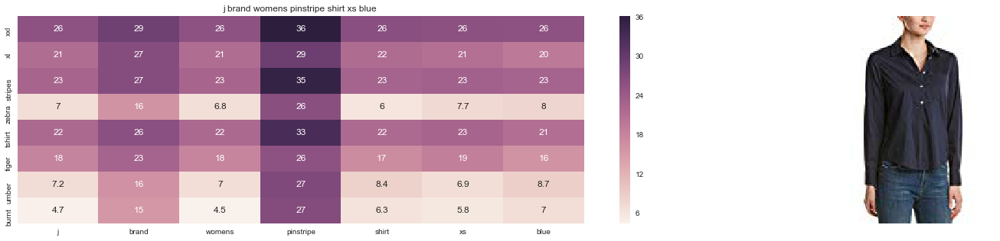

ASIN : B06XYP1X1F
Brand : J Brand Jeans
euclidean distance from input : 26.2582916021


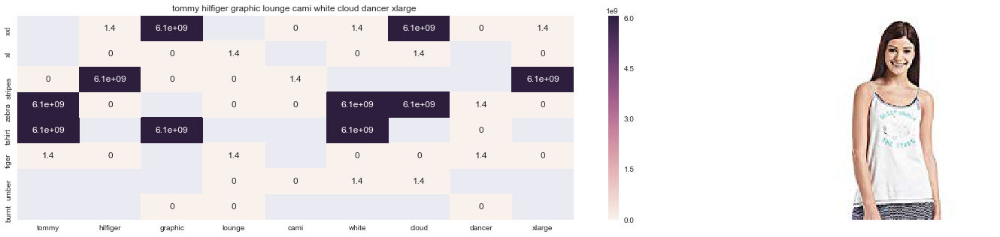

ASIN : B01BMSFYW2
Brand : igertommy hilf
euclidean distance from input : 26.4519249201


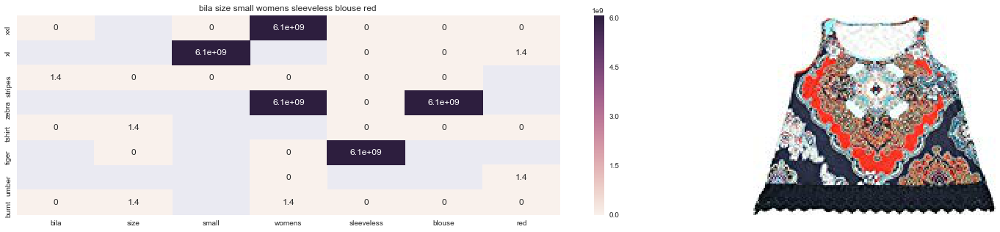

ASIN : B01L7ROZNC
Brand : Bila
euclidean distance from input : 26.9913735161


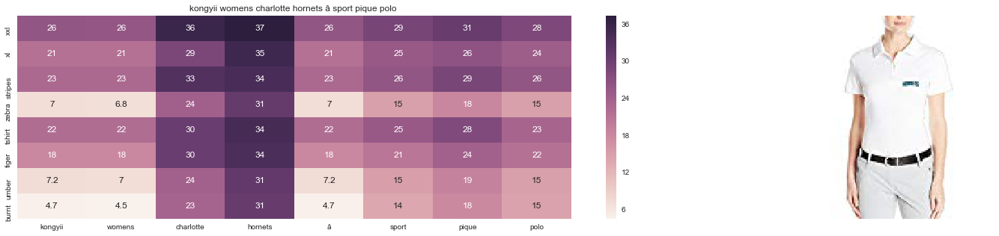

ASIN : B01FJVZST2
Brand : KONGYII
euclidean distance from input : 27.0082594523


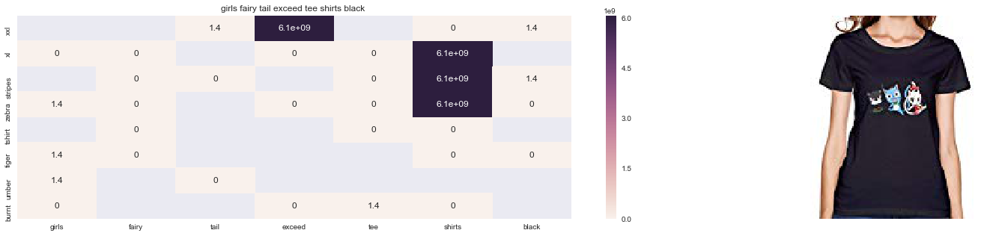

ASIN : B01L9F153U
Brand : ATYPEMX
euclidean distance from input : 27.4909618268


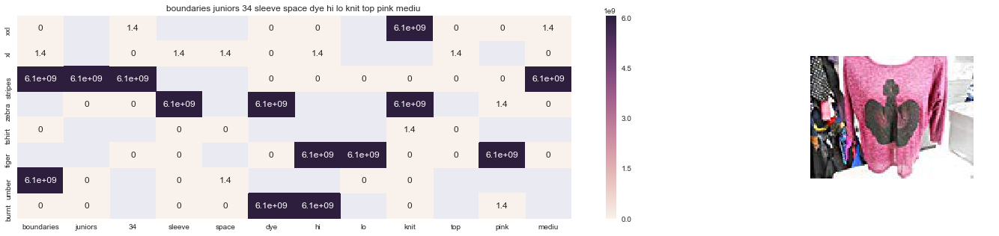

ASIN : B01EXXFS4M
Brand : No Boundaries
euclidean distance from input : 27.5049680949


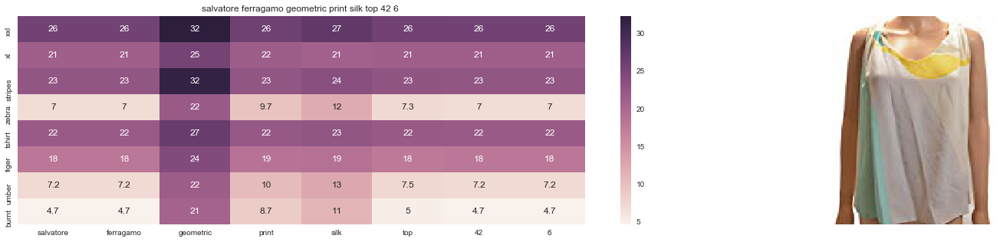

ASIN : B0756JTS1F
Brand : Salvatore Ferragamo
euclidean distance from input : 27.6574344525


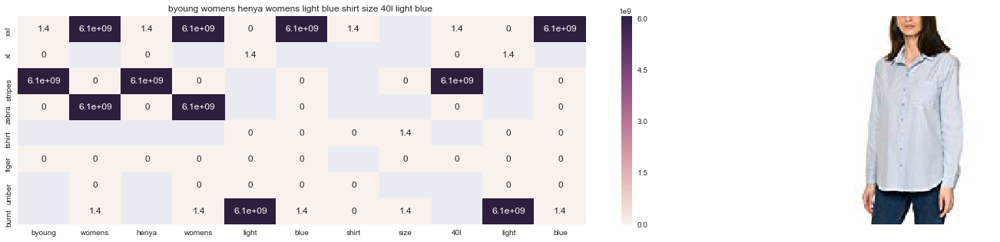

ASIN : B06Y41MRCH
Brand : Byoung
euclidean distance from input : 27.6623157042


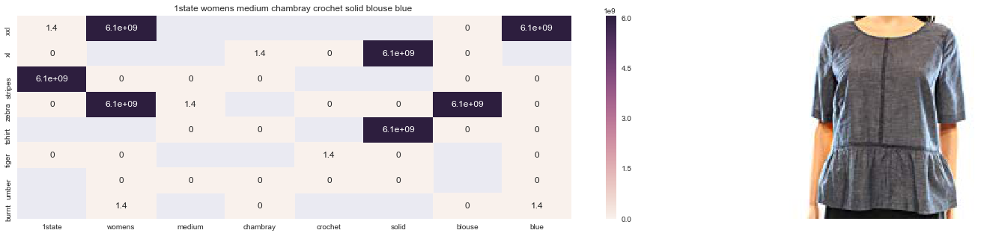

ASIN : B074MK6LV2
Brand : 1.State
euclidean distance from input : 27.685881413


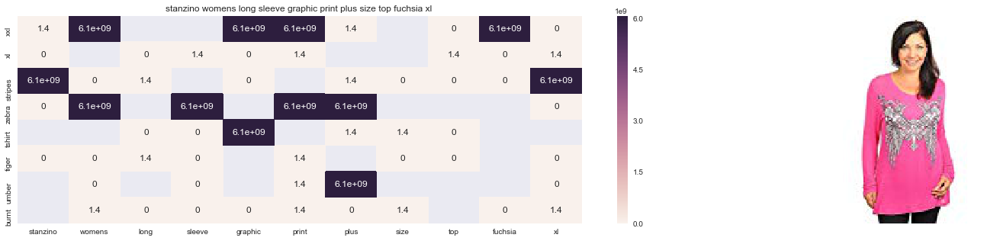

ASIN : B00DP4VHWI
Brand : Stanzino
euclidean distance from input : 27.8453533421


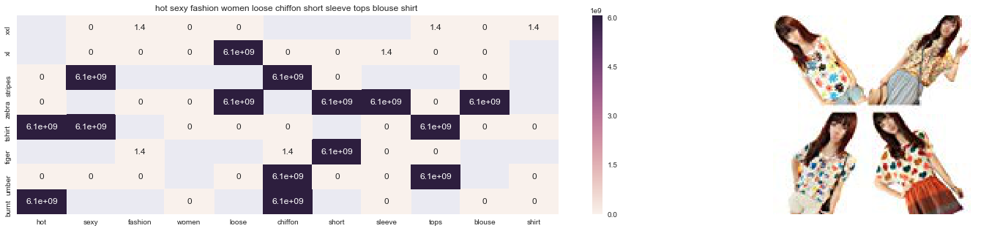

ASIN : B00JMAASRO
Brand : Wotefusi
euclidean distance from input : 27.9050650964


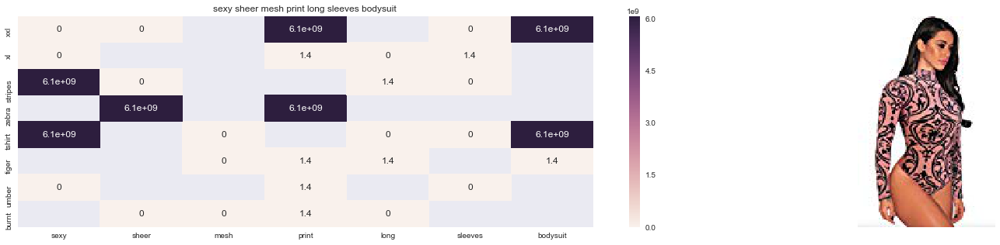

ASIN : B074Z5C98D
Brand : Ariella's closet
euclidean distance from input : 27.9098754186


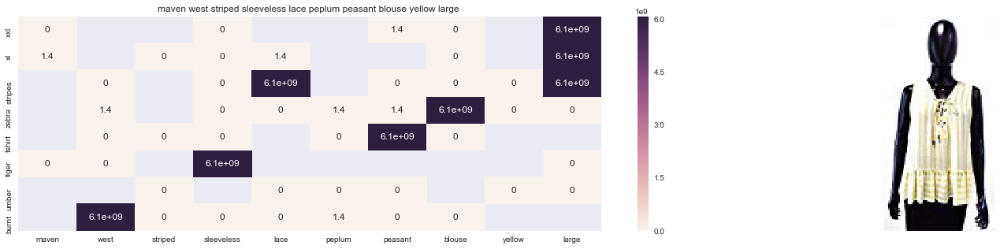

ASIN : B01M8GB3AL
Brand : Maven West
euclidean distance from input : 27.9369395256


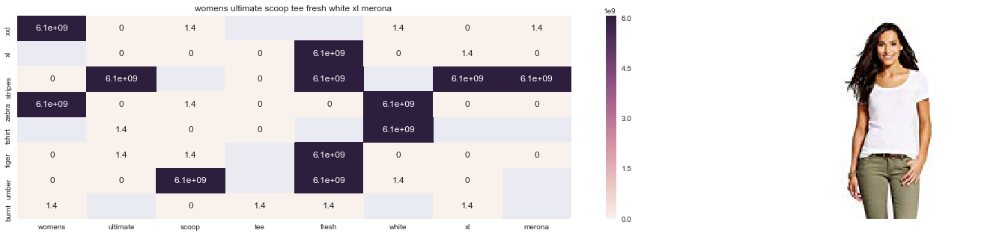

ASIN : B01G7XE50E
Brand : Merona
euclidean distance from input : 27.9475469956


In [23]:
# More weightage assigned to  CNN distance
idf_w2v_brand(12566, 1, 1, 1, 5 , 20)